Import Libraries

In [2]:
import tensorflow as tf
import tensorflow_datasets as tfds
import tensorflow_probability as tfp
from tensorflow.keras import layers, models
from tensorflow.keras.optimizers import Adam
from sklearn.metrics import classification_report
from collections import Counter
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from tensorflow.keras.models import Model

import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

import cv2  # OpenCV for the HOG descriptor
from PIL import Image, ExifTags
from skimage.feature import local_binary_pattern
from skimage import color

from tabulate import tabulate


Import dataset & EDA

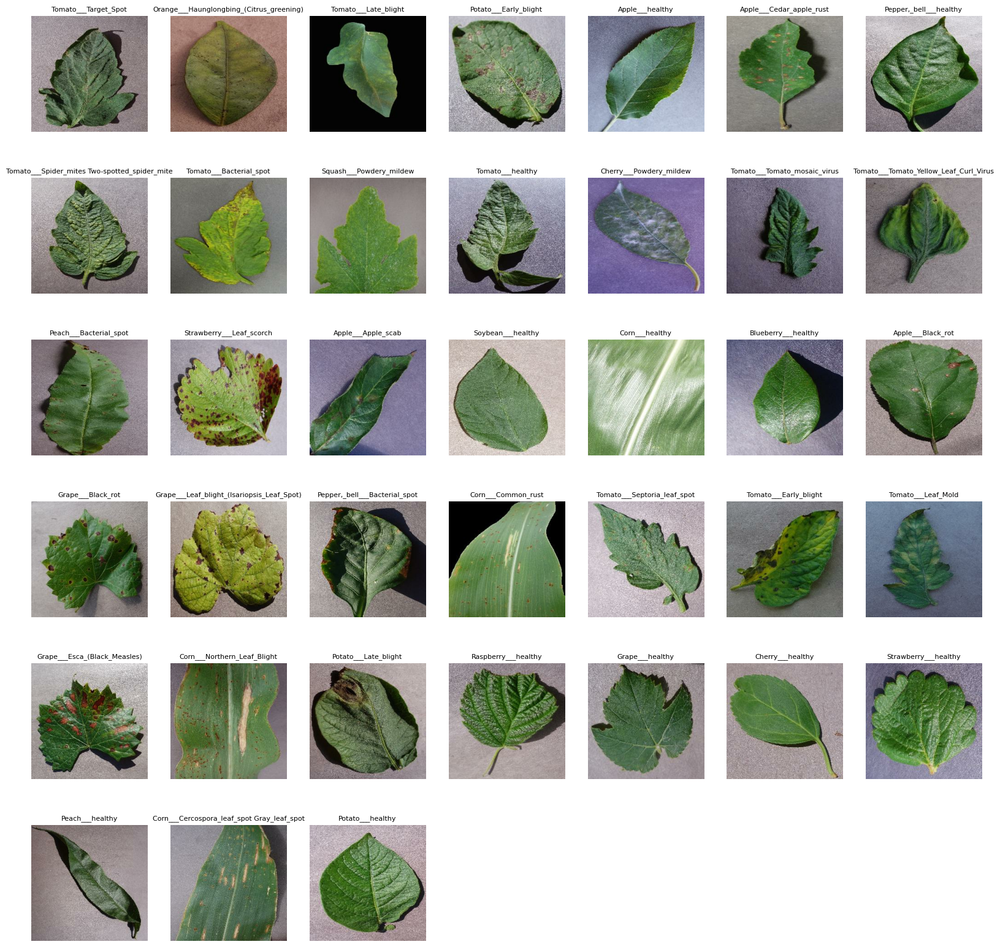

In [3]:
## Image for all categories

# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Extract the dataset
dataset = dataset['train']

# Function to preprocess images
def preprocess(image, label):
    image = tf.image.resize(image, [256, 256])
    image = image / 255.0  # Normalize the pixel values
    return image, label

# Apply preprocessing to the dataset
dataset = dataset.map(preprocess)

# Get one example per class
unique_labels = set()
samples = []

for image, label in dataset:
    label_str = info.features['label'].int2str(label.numpy())
    if label_str not in unique_labels:
        unique_labels.add(label_str)
        samples.append((image, label_str))
    if len(unique_labels) == info.features['label'].num_classes:
        break

# Display images for all categories
num_classes = len(samples)
plt.figure(figsize=(20, 20))
for i, (image, label) in enumerate(samples):
    ax = plt.subplot(6, 7, i + 1)  # Adjust the grid size if needed
    plt.imshow(image.numpy())
    plt.title(label, fontsize = 8)
    plt.axis('off')
plt.show()


Dataset Summary

Total number of images: 54303
Total number of categories: 38

Class distribution:

                                            Class  Count
0                            Tomato___Target_Spot   1404
1        Orange___Haunglongbing_(Citrus_greening)   5507
2                            Tomato___Late_blight   1908
3                           Potato___Early_blight   1000
4                                 Apple___healthy   1645
5                        Apple___Cedar_apple_rust    275
6                          Pepper,_bell___healthy   1477
7   Tomato___Spider_mites Two-spotted_spider_mite   1676
8                         Tomato___Bacterial_spot   2127
9                         Squash___Powdery_mildew   1835
10                               Tomato___healthy   1591
11                        Cherry___Powdery_mildew   1052
12                   Tomato___Tomato_mosaic_virus    373
13         Tomato___Tomato_Yellow_Leaf_Curl_Virus   5357
14                         Peach___Bacterial_spot   2297
15   

<Figure size 1200x800 with 0 Axes>

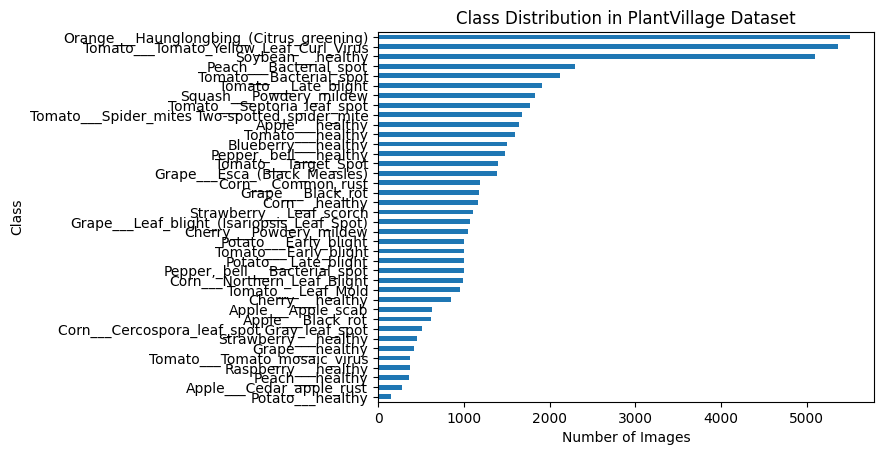

In [4]:
# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Extract the dataset
dataset = dataset['train']

# Initialize counters and a dictionary to store class information
class_counts = {}
total_images = 0

# Iterate through the dataset to count the occurrences of each class
for image, label in dataset:
    label_str = info.features['label'].int2str(label.numpy())
    if label_str not in class_counts:
        class_counts[label_str] = 0
    class_counts[label_str] += 1
    total_images += 1

# Convert the class counts to a DataFrame for better visualization
class_counts_df = pd.DataFrame(list(class_counts.items()), columns=['Class', 'Count'])

# Print summary information
print(f"Total number of images: {total_images}")
print(f"Total number of categories: {len(class_counts)}")
print("\nClass distribution:\n")
print(class_counts_df)

# Display class distribution
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 8))
class_counts_df.set_index('Class').sort_values('Count').plot(kind='barh', legend=False)
plt.title('Class Distribution in PlantVillage Dataset')
plt.xlabel('Number of Images')
plt.ylabel('Class')
plt.show()


Total number of images: 54303
Total number of crops: 14
Number of null images: 0
Number of null labels: 0

Healthy/Unhealthy split for each crop:

            Crop  healthy  unhealthy  total
0         Tomato     1591      16568  18159
1         Orange        0       5507   5507
2         Potato      152       2000   2152
3          Apple     1645       1526   3171
4   Pepper,_bell     1477        997   2474
5         Squash        0       1835   1835
6         Cherry      854       1052   1906
7          Peach      360       2297   2657
8     Strawberry      456       1109   1565
9        Soybean     5090          0   5090
10          Corn     1162       2690   3852
11     Blueberry     1502          0   1502
12         Grape      423       3639   4062
13     Raspberry      371          0    371


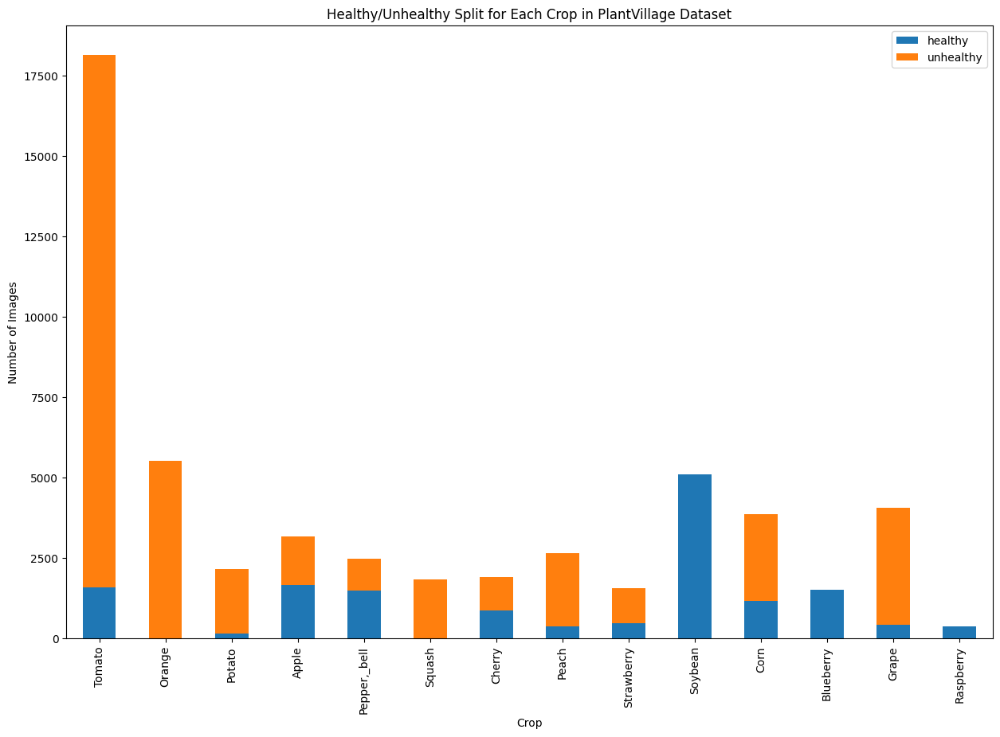

In [5]:
# Additional Summary healthy/unhealthy and Null

# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Extract the dataset
dataset = dataset['train']

# Initialize counters and a dictionary to store class information
crop_health_counts = {}
total_images = 0
null_image_count = 0
null_label_count = 0

# Iterate through the dataset to count the occurrences of each class
for image, label in dataset:
    if image is None:
        null_image_count += 1
        continue
    if label is None:
        null_label_count += 1
        continue

    label_str = info.features['label'].int2str(label.numpy())
    crop_name, health_status = label_str.split("___")
    if crop_name not in crop_health_counts:
        crop_health_counts[crop_name] = {"healthy": 0, "unhealthy": 0}
    if health_status == "healthy":
        crop_health_counts[crop_name]["healthy"] += 1
    else:
        crop_health_counts[crop_name]["unhealthy"] += 1
    total_images += 1

# Convert the crop health counts to a DataFrame for better visualization
crop_health_counts_df = pd.DataFrame(crop_health_counts).T
crop_health_counts_df = crop_health_counts_df.reset_index().rename(columns={"index": "Crop"})
crop_health_counts_df["total"] = crop_health_counts_df["healthy"] + crop_health_counts_df["unhealthy"]

# Print summary information
print(f"Total number of images: {total_images}")
print(f"Total number of crops: {len(crop_health_counts)}")
print(f"Number of null images: {null_image_count}")
print(f"Number of null labels: {null_label_count}")
print("\nHealthy/Unhealthy split for each crop:\n")
print(crop_health_counts_df)

# Display the data as a bar plot
crop_health_counts_df.set_index('Crop')[['healthy', 'unhealthy']].plot(kind='bar', stacked=True, figsize=(15, 10))
plt.title('Healthy/Unhealthy Split for Each Crop in PlantVillage Dataset')
plt.xlabel('Crop')
plt.ylabel('Number of Images')
plt.show()


In [6]:
# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Extract the dataset
dataset = dataset['train']

# Initialize counters and a dictionary to store class information
crop_health_counts = {}
total_images = 0

# Iterate through the dataset to count the occurrences of each class
for image, label in dataset:
    label_str = info.features['label'].int2str(label.numpy())
    crop_name, health_status = label_str.split("___")
    if crop_name not in crop_health_counts:
        crop_health_counts[crop_name] = {"healthy": 0, "unhealthy": 0}
    if health_status == "healthy":
        crop_health_counts[crop_name]["healthy"] += 1
    else:
        crop_health_counts[crop_name]["unhealthy"] += 1
    total_images += 1

# Convert the crop health counts to a DataFrame for better visualization
crop_health_counts_df = pd.DataFrame(crop_health_counts).T
crop_health_counts_df = crop_health_counts_df.reset_index().rename(columns={"index": "Crop"})
crop_health_counts_df["total"] = crop_health_counts_df["healthy"] + crop_health_counts_df["unhealthy"]

# Create a nicely formatted table using tabulate
table = tabulate(crop_health_counts_df, headers='keys', tablefmt='grid')

# Print the formatted table
print(table)


+----+--------------+-----------+-------------+---------+
|    | Crop         |   healthy |   unhealthy |   total |
+====+==============+===========+=============+=========+
|  0 | Tomato       |      1591 |       16568 |   18159 |
+----+--------------+-----------+-------------+---------+
|  1 | Orange       |         0 |        5507 |    5507 |
+----+--------------+-----------+-------------+---------+
|  2 | Potato       |       152 |        2000 |    2152 |
+----+--------------+-----------+-------------+---------+
|  3 | Apple        |      1645 |        1526 |    3171 |
+----+--------------+-----------+-------------+---------+
|  4 | Pepper,_bell |      1477 |         997 |    2474 |
+----+--------------+-----------+-------------+---------+
|  5 | Squash       |         0 |        1835 |    1835 |
+----+--------------+-----------+-------------+---------+
|  6 | Cherry       |       854 |        1052 |    1906 |
+----+--------------+-----------+-------------+---------+
|  7 | Peach  

In [7]:
# Size and number of channels

# Collect unique dimensions
unique_dimensions = set()

for image, label in dataset:
    unique_dimensions.add(image.shape)

# Display information about the dataset
print("Reported image shape from metadata:", info.features['image'].shape)

# Display unique dimensions collected
print("Unique image dimensions in the dataset:", unique_dimensions)


Reported image shape from metadata: (None, None, 3)
Unique image dimensions in the dataset: {TensorShape([256, 256, 3])}


In [8]:
# Create table with disease names

# Load the PlantVillage dataset with metadata (assuming it's already loaded in your case)
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Extract label names
label_names = info.features['label'].names

# Create a DataFrame from the label names
df_labels = pd.DataFrame(label_names, columns=['Label Names'])

# Print the DataFrame using tabulate for a nice table format
print(tabulate(df_labels, headers='keys', tablefmt='psql', showindex=False))


+-----------------------------------------------+
| Label Names                                   |
|-----------------------------------------------|
| Apple___Apple_scab                            |
| Apple___Black_rot                             |
| Apple___Cedar_apple_rust                      |
| Apple___healthy                               |
| Blueberry___healthy                           |
| Cherry___healthy                              |
| Cherry___Powdery_mildew                       |
| Corn___Cercospora_leaf_spot Gray_leaf_spot    |
| Corn___Common_rust                            |
| Corn___healthy                                |
| Corn___Northern_Leaf_Blight                   |
| Grape___Black_rot                             |
| Grape___Esca_(Black_Measles)                  |
| Grape___healthy                               |
| Grape___Leaf_blight_(Isariopsis_Leaf_Spot)    |
| Orange___Haunglongbing_(Citrus_greening)      |
| Peach___Bacterial_spot                        |


In [9]:
# Table with crop name, healthy/unhealthy and disease name

# Sample data based on your label format
labels = [
    'Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust',
    'Apple___healthy', 'Blueberry___healthy', 'Cherry___healthy',
    'Cherry___Powdery_mildew', 'Corn___Cercospora_leaf_spot Gray_leaf_spot',
    'Corn___Common_rust', 'Corn___healthy', 'Corn___Northern_Leaf_Blight',
    'Grape___Black_rot', 'Grape___Esca_(Black_Measles)', 'Grape___healthy',
    'Grape___Leaf_blight_(Isariopsis_Leaf_Spot)', 'Orange___Haunglongbing_(Citrus_greening)',
    'Peach___Bacterial_spot', 'Peach___healthy', 'Pepper,_bell___Bacterial_spot',
    'Pepper,_bell___healthy', 'Potato___Early_blight', 'Potato___healthy',
    'Potato___Late_blight', 'Raspberry___healthy', 'Soybean___healthy',
    'Squash___Powdery_mildew', 'Strawberry___healthy', 'Strawberry___Leaf_scorch',
    'Tomato___Bacterial_spot', 'Tomato___Early_blight', 'Tomato___healthy',
    'Tomato___Late_blight', 'Tomato___Leaf_Mold', 'Tomato___Septoria_leaf_spot',
    'Tomato___Spider_mites Two-spotted_spider_mite', 'Tomato___Target_Spot',
    'Tomato___Tomato_mosaic_virus', 'Tomato___Tomato_Yellow_Leaf_Curl_Virus'
]

# Create a DataFrame to hold the data
df = pd.DataFrame(columns=['Crop', 'Health_Status', 'Features'])

# Populate the DataFrame using concat instead of append
for label in labels:
    parts = label.split("___")
    crop = parts[0]
    if 'healthy' in parts[1]:
        health_status = 'Healthy'
        features = 'None'
    else:
        health_status = 'Unhealthy'
        features = parts[1]

    # Create a new DataFrame for the current row and concatenate it to the main DataFrame
    new_row = pd.DataFrame({'Crop': [crop], 'Health_Status': [health_status], 'Features': [features]})
    df = pd.concat([df, new_row], ignore_index=True)

# Display the DataFrame
#print(df)
df


,Crop,Health_Status,Features
0,Apple,Unhealthy,Apple_scab
1,Apple,Unhealthy,Black_rot
2,Apple,Unhealthy,Cedar_apple_rust
3,Apple,Healthy,None
4,Blueberry,Healthy,None
5,Cherry,Healthy,None
6,Cherry,Unhealthy,Powdery_mildew
7,Corn,Unhealthy,Cercospora_leaf_spot Gray_leaf_spot
8,Corn,Unhealthy,Common_rust
9,Corn,Healthy,None


# Tomato Dataset

Tomato - EDA and Pre-processing

In [10]:
# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)

# Assuming 'train' is the correct split; adjust as necessary based on 'info.splits'
train_dataset = dataset['train']  # Correctly access the 'train'

def preprocess_and_filter(image, label):
    # Resize and normalize the image
    image = tf.image.resize(image, [256, 256])
    image = image / 255.0
    # Decode the label into a string
    label_str = info.features['label'].int2str(label.numpy())
    # Check if the label denotes a tomato
    is_tomato = tf.strings.regex_full_match(label_str, ".*Tomato.*")
    return is_tomato, image, label_str

def apply_preprocess_and_filter(image, label):
    return tf.py_function(preprocess_and_filter, [image, label], [tf.bool, tf.float32, tf.string])

def filter_tomato(is_tomato, image, label):
    return is_tomato

def map_to_image_label(is_tomato, image, label):
    return image, label

# Apply preprocessing and filtering to the dataset
processed_dataset = train_dataset.map(apply_preprocess_and_filter, num_parallel_calls=tf.data.experimental.AUTOTUNE)
tomato_dataset = processed_dataset.filter(filter_tomato).map(map_to_image_label)


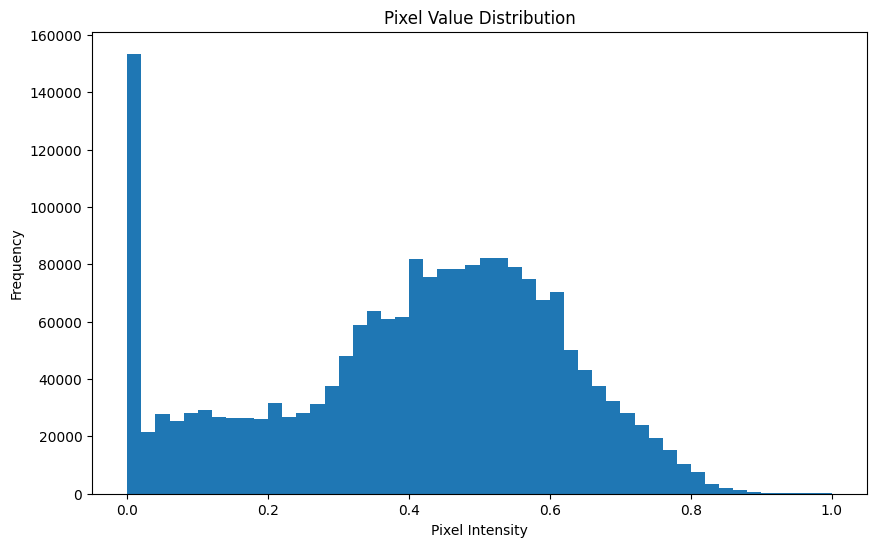

In [11]:
# Check Resize and normalization
def plot_pixel_distribution(dataset, sample_size=10):
    pixel_values = []
    for image, _ in dataset.take(sample_size):
        pixel_values.extend(image.numpy().flatten())

    plt.figure(figsize=(10, 6))
    plt.hist(pixel_values, bins=50, range=(0, 1))
    plt.title('Pixel Value Distribution')
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')
    plt.show()

# Plotting the pixel value distribution for a sample of images
plot_pixel_distribution(tomato_dataset)


In [12]:
# Tomato dataset properties.
def check_dataset_properties(dataset):
    for image, label in dataset.take(10):  # Check 10 images as a sample
        # Check image size
        assert image.shape == (256, 256, 3), f"Image shape mismatch: {image.shape}"
        # Check normalization
        assert tf.reduce_min(image) >= 0.0 and tf.reduce_max(image) <= 1.0, "Image not normalized"
        print(f"Checked image with label: {label.numpy().decode('utf-8')} - Size: {image.shape}, Min pixel value: {tf.reduce_min(image)}, Max pixel value: {tf.reduce_max(image)}")

# Run the checks
check_dataset_properties(tomato_dataset)


Checked image with label: Tomato___Target_Spot - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 1.0
Checked image with label: Tomato___Late_blight - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 0.9647058844566345
Checked image with label: Tomato___Spider_mites Two-spotted_spider_mite - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 1.0
Checked image with label: Tomato___Bacterial_spot - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 0.8313725590705872
Checked image with label: Tomato___Late_blight - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 0.9921568632125854
Checked image with label: Tomato___healthy - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 1.0
Checked image with label: Tomato___Spider_mites Two-spotted_spider_mite - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value: 1.0
Checked image with label: Tomato___Tomato_mosaic_virus - Size: (256, 256, 3), Min pixel value: 0.0, Max pixel value

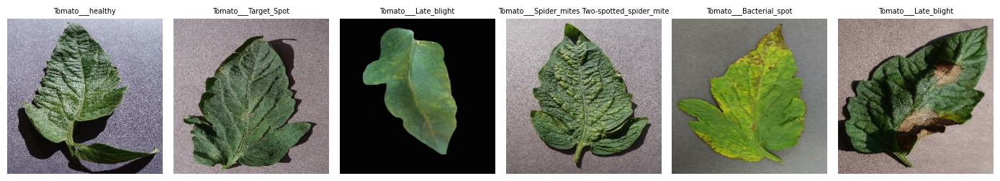

In [13]:
# Print Tomato images

# Collect examples
healthy_tomatoes = []
unhealthy_tomatoes = []

for image, label in tomato_dataset.take(10):
    label = label.numpy().decode('utf-8')
    if 'healthy' in label and len(healthy_tomatoes) < 5:
        healthy_tomatoes.append((image.numpy(), label))
    elif 'healthy' not in label and len(unhealthy_tomatoes) < 5:
        unhealthy_tomatoes.append((image.numpy(), label))

# Display the images
plt.figure(figsize=(14, 14))
for i, (image, label) in enumerate(healthy_tomatoes + unhealthy_tomatoes):
    ax = plt.subplot(2, 6, i + 1)
    plt.imshow(image)
    plt.title(label, fontsize = 7)
    plt.axis('off')
plt.tight_layout() # Ensure there is space for title
plt.show()


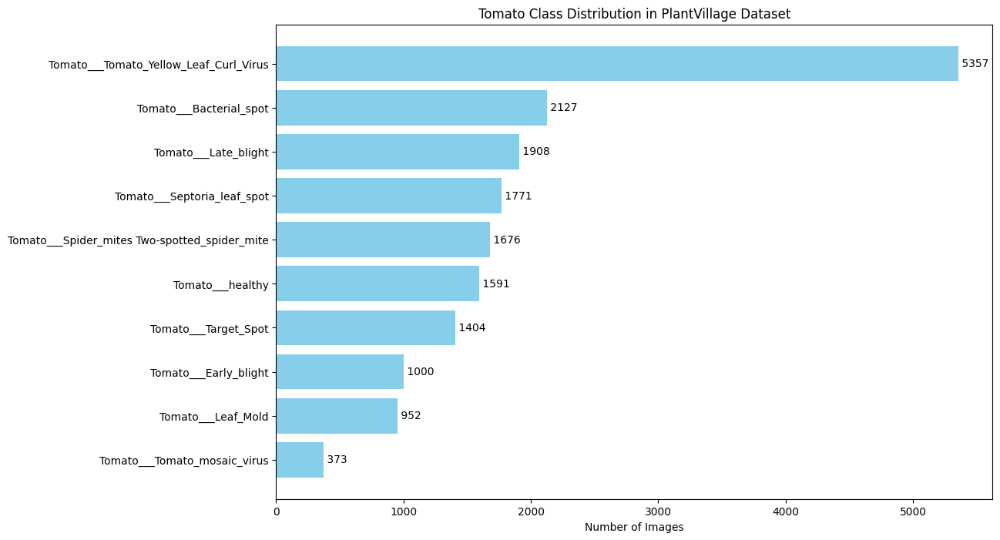

In [14]:
# Apply your preprocessing, filtering, and mapping functions
processed_dataset = dataset['train'].map(apply_preprocess_and_filter, num_parallel_calls=tf.data.experimental.AUTOTUNE)
tomato_dataset = processed_dataset.filter(filter_tomato).map(map_to_image_label)

# Collect labels
labels = []

# Iterate through the tomato_dataset to collect labels
for image, label in tomato_dataset:
    labels.append(label.numpy().decode('utf-8'))

# Count the occurrences of each label
label_counts = Counter(labels)

# Data for plotting
classes = list(label_counts.keys())
counts = list(label_counts.values())

# Sort classes by counts (optional)
sorted_classes = sorted(label_counts.items(), key=lambda x: x[1], reverse=True)
classes, counts = zip(*sorted_classes)  # Unzip the sorted items

# Creating a horizontal bar chart for better readability
plt.figure(figsize=(12, 8))
bars = plt.barh(classes, counts, color='skyblue')  # Horizontal bar chart
plt.xlabel('Number of Images')
plt.title('Tomato Class Distribution in PlantVillage Dataset')

# Adding text labels to each bar
for bar, count in zip(bars, counts):
    plt.text(bar.get_width(), bar.get_y() + bar.get_height()/2, f' {count}', va='center')

plt.gca().invert_yaxis()  # Invert y-axis to have the highest counts at the top
plt.show()


Grayscale images.

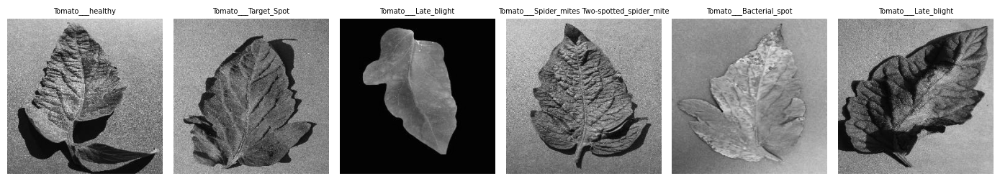

In [15]:
# Preprocess and filter function
def preprocess_and_filter(image, label):
    # Resize the image
    image = tf.image.resize(image, [256, 256])

    # Convert image to grayscale
    image = tf.image.rgb_to_grayscale(image)

    # Normalize the image
    image = image / 255.0

    # Decode the label and check if it's a tomato
    label_str = info.features['label'].int2str(label.numpy())
    is_tomato = tf.strings.regex_full_match(label_str, ".*Tomato.*")
    return is_tomato, image, label_str

# Named function to replace lambda in map
def apply_preprocess_and_filter(image, label):
    return tf.py_function(preprocess_and_filter, [image, label], [tf.bool, tf.float32, tf.string])

# Filter to retain only tomato images
def filter_tomato(is_tomato, image, label):
    return is_tomato

# Map to return only image and label
def map_to_image_label(is_tomato, image, label):
    return image, label

# Assume 'dataset' is your TensorFlow dataset object initialized properly
# Apply preprocessing
processed_dataset = dataset['train'].map(apply_preprocess_and_filter, num_parallel_calls=tf.data.experimental.AUTOTUNE)
tomato_dataset = processed_dataset.filter(filter_tomato).map(map_to_image_label)

# Collect examples and display
healthy_tomatoes = []
unhealthy_tomatoes = []

for image, label in tomato_dataset.take(10):
    label = label.numpy().decode('utf-8')
    if 'healthy' in label and len(healthy_tomatoes) < 5:
        healthy_tomatoes.append((image.numpy(), label))
    elif 'healthy' not in label and len(unhealthy_tomatoes) < 5:
        unhealthy_tomatoes.append((image.numpy(), label))

# Display the images in grayscale
plt.figure(figsize=(14, 14))
for i, (image, label) in enumerate(healthy_tomatoes + unhealthy_tomatoes):
    ax = plt.subplot(2, 6, i + 1)
    plt.imshow(image.squeeze(), cmap='gray')  # Use 'squeeze' to remove the single-channel dimension and 'cmap' to display in grayscale
    plt.title(label, fontsize=7)
    plt.axis('off')
plt.tight_layout()  # Ensure there is space for title
plt.show()


Using grayscale does not seem a good approach because  the specific color variations associated with different plant health conditions are obscured, as shown in the image above. We would then use color augumentation and color threesholding.

*Color augumentation* enhances color features by adjusting image properties such as saturation, brightness, and contrast. This can help highlight subtle color differences that indicate disease.

*Color thresholding* can help isolate areas of an image that fall within specific color ranges which might be indicative of disease. This because some diseases might be identified by particular color ranges.

We then re-load the PlantVillage dataset, ensure images size is 256x256 and normalize images.

Color Augmentation.

In [16]:
# Load the PlantVillage dataset
dataset, info = tfds.load('plant_village', with_info=True, as_supervised=True)
train_dataset = dataset['train']  # Assuming 'train' is the correct split

def preprocess_and_filter(image, label):
    # Resize the image to ensure it is 256x256
    image = tf.image.resize(image, [256, 256])

    # Check if the image has 3 channels (RGB) and correct if not
    image = tf.cond(
        tf.shape(image)[-1] == 1,
        lambda: tf.image.grayscale_to_rgb(image),  # Convert grayscale to RGB if it's only one channel
        lambda: image  # Use the image as is if it already has three channels
    )

    # Normalize the image
    image = image / 255.0

    # Decode the label and check if it's a tomato
    label_str = info.features['label'].int2str(label.numpy())
    is_tomato = tf.strings.regex_full_match(label_str, ".*Tomato.*")
    return is_tomato, image, label_str

def apply_preprocess_and_filter(image, label):
    return tf.py_function(preprocess_and_filter, [image, label], [tf.bool, tf.float32, tf.string])

def filter_tomato(is_tomato, image, label):
    return is_tomato

def map_to_image_label(is_tomato, image, label):
    return image, label

# Apply preprocessing and filtering to the dataset
processed_dataset = train_dataset.map(apply_preprocess_and_filter, num_parallel_calls=tf.data.experimental.AUTOTUNE)
tomato_dataset = processed_dataset.filter(filter_tomato).map(map_to_image_label)


In [17]:
# Color Augumentation
# Color augmentation using TensorFlow
def color_augment(image, label):
    image = tf.image.random_brightness(image, max_delta=0.1)  # Select brightness (started with max_delta=0.1)
    image = tf.image.random_contrast(image, lower=0.9, upper=1.4)  # Select contrast (started with lower=0.9, upper=1.1)
    image = tf.image.random_saturation(image, lower=0.9, upper=1.1)  # Select saturation (staretd with lower=0.9, upper=1.1)
    image = tf.clip_by_value(image, 0.0, 1.0)  # Ensure values are within [0, 1]
    return image, label

# Apply color augmentation to the tomato dataset
augmented_tomato_dataset = tomato_dataset.map(color_augment)


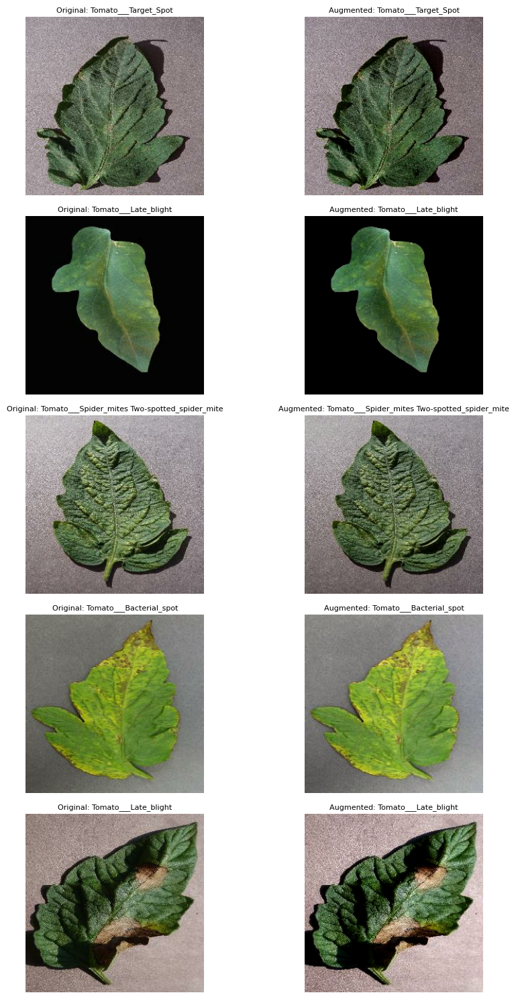

In [18]:
def display_images(dataset, num_images=5):
    plt.figure(figsize=(10, num_images * 3))

    for i, (image, label) in enumerate(dataset.take(num_images)):
        ax = plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(image.numpy())
        plt.title(f"Original: {label.numpy().decode('utf-8')}", fontsize=8)
        plt.axis("off")

        # Apply color augmentation to the same image for comparison
        augmented_image, _ = color_augment(image, label)

        ax = plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(augmented_image.numpy())
        plt.title(f"Augmented: {label.numpy().decode('utf-8')}",  fontsize=8)
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Assuming 'tomato_dataset' is already defined and preprocessed
display_images(tomato_dataset)


Color Thresholding.

In [19]:
# Thresholding function
def apply_color_threshold(image, label):
    # Convert to HSV color space
    hsv_image = tf.image.rgb_to_hsv(image)

    # Define thresholds for detecting specific colors
    lower_bound = tf.constant([0.1, 0.3, 0.3])  # Adjust these values as needed
    upper_bound = tf.constant([0.2, 1.0, 1.0])

    # Create a mask based on thresholds
    mask = tf.logical_and(
        tf.greater_equal(hsv_image, lower_bound),
        tf.less_equal(hsv_image, upper_bound)
    )
    masked_image = tf.where(mask, image, tf.zeros_like(image))

    # Return both the original and the processed image
    return image, masked_image, label


In [20]:
# Map the dataset through the updated function
thresholded_dataset = tomato_dataset.map(
    lambda image, label: apply_color_threshold(image, label)
)

In [21]:
# Adjust display function
def display_images(dataset, num_images=5, title_font_size=10):
    plt.figure(figsize=(12, num_images * 4))  # Adjust figure size as needed

    for i, (original_image, processed_image, label) in enumerate(dataset.take(num_images)):
        # Display original image
        ax = plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(original_image.numpy())
        plt.title(f"Original: {label.numpy().decode('utf-8')}", fontsize=title_font_size)
        plt.axis("off")

        # Display processed image
        ax = plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(processed_image.numpy())
        plt.title(f"Processed: {label.numpy().decode('utf-8')}", fontsize=title_font_size)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


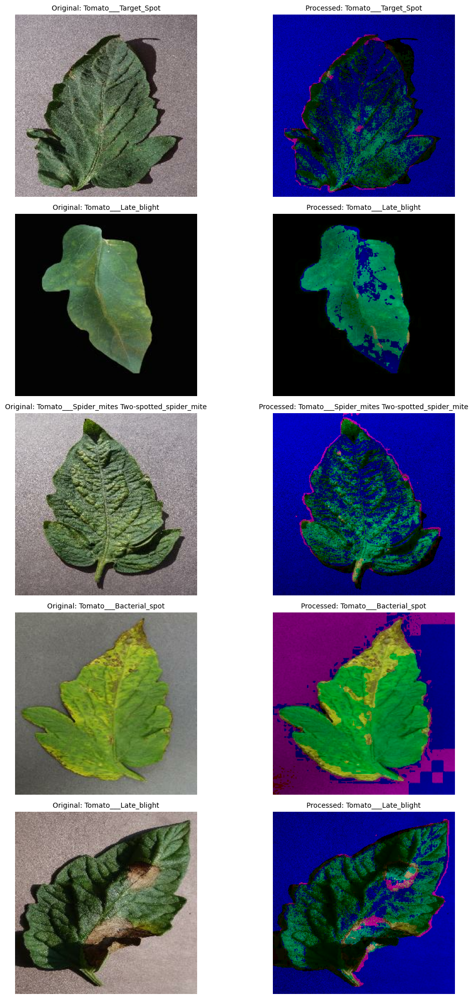

In [22]:
# Display original vs processed images
display_images(thresholded_dataset, num_images=5, title_font_size=10)


Color Augmentation and Thresholding together.

In [28]:
def augment_and_threshold(image, label):
    # Apply color augmentation
    augmented_image, _ = color_augment(image, label)
    # Apply color thresholding
    original_image, thresholded_image, _ = apply_color_threshold(augmented_image, label)
    # Return the processed images
    return original_image, thresholded_image, label


In [29]:
# Map the dataset through the updated function
augmented_and_thresholded_dataset = tomato_dataset.map(
    lambda image, label: augment_and_threshold(image, label),
    num_parallel_calls=tf.data.experimental.AUTOTUNE
)


In [30]:
# Display the function

def display_comparisons(dataset, num_images=5, title_font_size=10):
    plt.figure(figsize=(12, num_images * 4))  # Set figure size

    for i, (original_image, processed_image, label) in enumerate(dataset.take(num_images)):
        # Display original image
        ax = plt.subplot(num_images, 2, 2*i + 1)
        plt.imshow(original_image.numpy())
        plt.title(f"Original: {label.numpy().decode('utf-8')}", fontsize=title_font_size)
        plt.axis("off")

        # Display processed image
        ax = plt.subplot(num_images, 2, 2*i + 2)
        plt.imshow(processed_image.numpy())
        plt.title(f"Processed: {label.numpy().decode('utf-8')}", fontsize=title_font_size)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


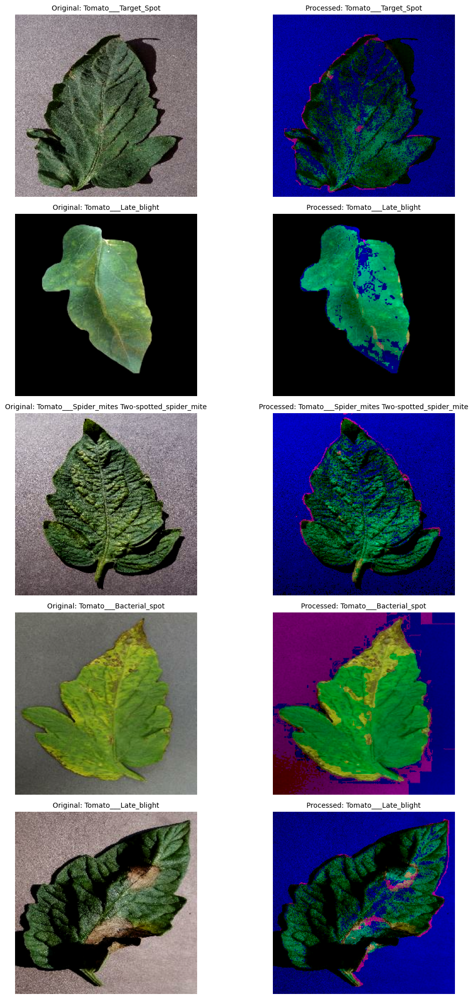

In [31]:
# Display original vs processed images
display_comparisons(augmented_and_thresholded_dataset, num_images=5, title_font_size=10)


# Features extraction.

####1. Simple Features exctraction

#####1a. HSV Color Histogram and Edges

HSV (Hue, Saturation, Value) Histogram is driven by its capacity to separate color components from intensity, which simplifies many types of image analyses and manipulations. This separation is particularly valuable in environments with variable lighting or when color information is a critical parameter, enhancing both the robustness and accuracy of image processing tasks.

Edge detection focuses on identifying the boundaries of objects within images, which can be particularly useful for highlighting regions of interest or changes in texture that are symptomatic of plant diseases. WE used the **Canny edge detector** is particularly well-regarded for its ability to provide clear and thin edges, which are crucial for accurately identifying areas affected by disease.

In [32]:
# Create HSV function
def extract_hsv_histogram(image, label):
    hsv_image = tf.image.rgb_to_hsv(image)
    hue_hist = tf.histogram_fixed_width(hsv_image[:, :, 0], [0, 1], nbins=10)
    sat_hist = tf.histogram_fixed_width(hsv_image[:, :, 1], [0, 1], nbins=10)
    val_hist = tf.histogram_fixed_width(hsv_image[:, :, 2], [0, 1], nbins=10)
    hue_hist = hue_hist / tf.reduce_sum(hue_hist)
    sat_hist = sat_hist / tf.reduce_sum(sat_hist)
    val_hist = val_hist / tf.reduce_sum(val_hist)
    return tf.cast(tf.concat([hue_hist, sat_hist, val_hist], axis=0), tf.float32), label

# Create Edges function
def extract_color_edges(image, label):
    def _edges(image):
        # Ensure the image is in uint8 format
        image = (image * 255).astype(np.uint8)

        # Split the image into its respective color channels
        channels = cv2.split(image)

        # Apply Canny edge detector to each channel
        edges = [cv2.Canny(channel, 100, 200) for channel in channels]

        # Combine edge maps back into a single image
        combined_edges = np.bitwise_or.reduce(edges)
        return combined_edges

    # Wrap using tf.py_function
    edge_features = tf.numpy_function(_edges, [image], tf.uint8)

    # Normalize the edge features to be [0, 1]
    edge_features = tf.cast(edge_features, tf.float32) / 255.0

    # Flatten the edge features for consistency with other feature shapes
    edge_features = tf.reshape(edge_features, [-1])
    return edge_features, label


#### 2. Complex Features, Pre-trained Neural Network (ResNet)

Extracting features using a pre-trained model like ResNet can capture high-level patterns in the data that are beneficial for complex image classification tasks.

In [33]:
# Load ResNet50 without the top layer to use as a feature extractor
resnet_model = ResNet50(include_top=False, weights='imagenet', pooling='avg')

def extract_resnet_features(image, label):
    # Preprocess the image for ResNet50
    image = preprocess_input(image)
    # Expand dimensions to match the expected input of ResNet
    image = tf.expand_dims(image, axis=0)
    # Extract features
    features = resnet_model(image, training=False)
    # Remove the batch dimension
    features = tf.reshape(features, [-1])
    return features, label


In [34]:
# Combine all features
# Create function that concantenate all feature extraction
def concatenate_all_features(image, label):
    hsv_features, _ = extract_hsv_histogram(image, label)
    edge_features, _ = extract_color_edges(image, label)  # or extract_gradient_edges
    resnet_features, _ = extract_resnet_features(image, label)
    # Concatenate all features together
    all_features = tf.concat([hsv_features, edge_features, resnet_features], axis=0)
    return all_features, label

# Map the full feature extraction function over the dataset
full_feature_dataset = tomato_dataset.map(concatenate_all_features, num_parallel_calls=tf.data.experimental.AUTOTUNE)


In [35]:
# Verify features extraction
# Print first 10 features to inspect values
for features, label in full_feature_dataset.take(1):
    print("Feature shape:", features.shape)
    print("Feature dtype:", features.dtype)
    print("Sample features:", features.numpy()[:10])


Feature shape: (67614,)
Feature dtype: <dtype: 'float32'>
Sample features: [1.6494751e-01 2.7679443e-02 3.2989502e-01 9.3948364e-02 4.5776367e-05
 0.0000000e+00 0.0000000e+00 6.1035156e-05 8.5296631e-03 3.7489319e-01]


In [36]:
# Standardizing the combined features, avoiding predominace
def normalize_features(features, label):
    min_vals = tf.reduce_min(features)
    max_vals = tf.reduce_max(features)
    normalized_features = (features - min_vals) / (max_vals - min_vals + 1e-6)
    return normalized_features, label

# Apply normalization to the dataset instead of standardization
normalized_feature_dataset = full_feature_dataset.map(normalize_features)


In [37]:
def plot_feature_distributions(features_dataset, num_features=10):
    # Collect features in an array
    all_features = []
    for features, labels in features_dataset.take(100):  # Taking a sample of 100 batches
        all_features.append(features.numpy())
    all_features = np.array(all_features)

    # Ensure all_features is not an empty list
    if all_features.size == 0:
        print("No data available for plotting.")
        return

    # Reshape if the data is deeply nested or if first dimension is not the batch dimension
    if len(all_features.shape) > 2:
        all_features = all_features.reshape(-1, all_features.shape[-1])

    # Plot histograms for the first few features
    plt.figure(figsize=(12, 8))
    for i in range(min(num_features, all_features.shape[1])):
        plt.subplot(2, 5, i+1)
        plt.hist(all_features[:, i], bins=30, alpha=0.7)
        plt.title(f'Feature {i+1}')
        plt.tight_layout()

    plt.show()


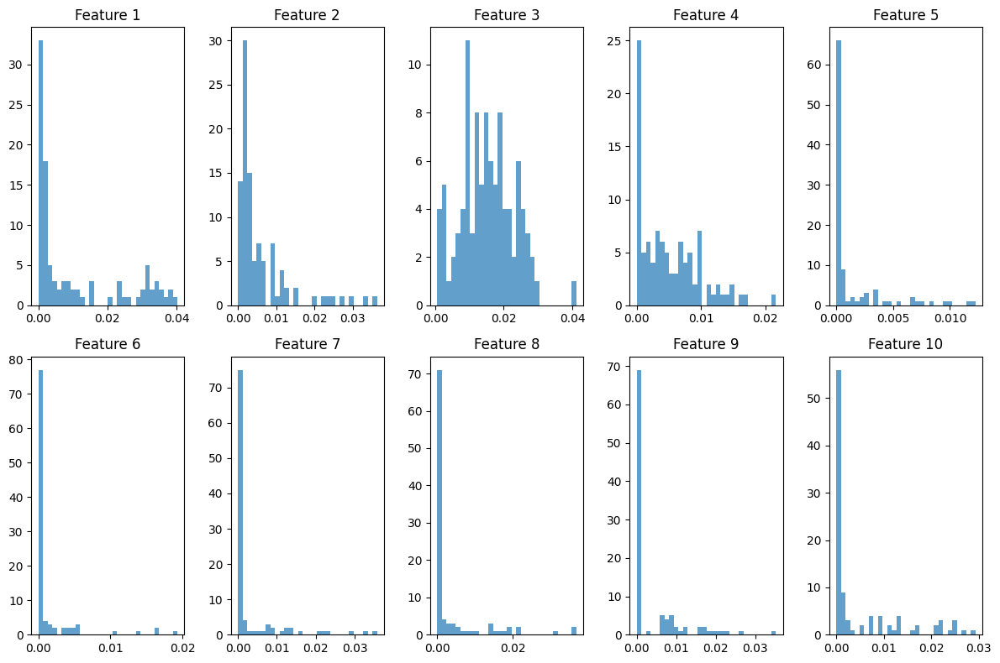

In [38]:
# Recreate plot after normalization
plot_feature_distributions(normalized_feature_dataset)


In [39]:
print("Sample entries from dataset:")
for features, label in full_feature_dataset.take(3):
    print("Features:", features.numpy())
    print("Label:", label.numpy())


Sample entries from dataset:
Features: [0.16494751 0.02767944 0.32989502 ... 0.         0.         0.        ]
Label: b'Tomato___Target_Spot'
Features: [0.6377106  0.01251221 0.15776062 ... 0.         0.         0.        ]
Label: b'Tomato___Late_blight'
Features: [0.18759155 0.02827454 0.36758423 ... 0.         0.         0.        ]
Label: b'Tomato___Spider_mites Two-spotted_spider_mite'


In [40]:
print("Sample entries from dataset:")
for features, label in normalized_feature_dataset.take(3):
    print("Features:", features.numpy())
    print("Label:", label.numpy())


Sample entries from dataset:
Features: [0.00924553 0.00155147 0.01849107 ... 0.         0.         0.        ]
Label: b'Tomato___Target_Spot'
Features: [0.03480211 0.00068284 0.00860955 ... 0.         0.         0.        ]
Label: b'Tomato___Late_blight'
Features: [0.01042448 0.00157122 0.0204267  ... 0.         0.         0.        ]
Label: b'Tomato___Spider_mites Two-spotted_spider_mite'


# Model

### Dataset Splitting

# Classifier Training and Evaluation

#### Classifier #1 - Logistic Regression

#### Classifier #2 - Simple Perceptron